In [ ]:
# Εγκατάσταση πακέτου ppscore
!pip install ppscore

In [ ]:
# Εγκατάσταση πακέτου dataprep (https://dataprep.ai/)
!pip install dataprep

In [ ]:
# Εισαγωγή βιβλιοθηκών - πακέτων
import numpy as np
import pandas as pd
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

import ppscore as pps
from dataprep.eda import create_report

In [ ]:
# Εισαγωγή του συνόλου δεδομένων
csv_file = "https://raw.githubusercontent.com/kdemertzis/EKPA/refs/heads/main/Data/DarkNet.csv"
dataset=pd.read_csv(csv_file)
# dataset['Label-1'].replace({'Non-Tor': 0, 'NonVPN': 0, 'VPN': 0, 'Tor': 1}, inplace=True)
dataset['Label-1'].replace({'NonVPN': 'Non-Tor', 'VPN': 'Non-Tor'}, inplace=True)
# dataset['Label-1'].replace({'NonVPN': 'Non-Tor', 'VPN': 'Non-Tor', 'Tor': 'Tor', 'Non-Tor': 'Non-Tor'}, inplace=True)

# Περιγραφικά στατιστικά συνόλου δεδομένων
pd.set_option('display.max_columns', None)
dataset.describe()

<ipython-input-21-98c3dc37eb2e>:3: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  dataset=pd.read_csv(csv_file)


,Src_Port,Dst_Port,Protocol,Flow_Duration,Total_Fwd_Packet,Total_Bwd_packets,Total_Length_of_Fwd_Packet,Total_Length_of_Bwd_Packet,Fwd_Packet_Length_Max,Fwd_Packet_Length_Min,Fwd_Packet_Length_Mean,Fwd_Packet_Length_Std,Bwd_Packet_Length_Max,Bwd_Packet_Length_Min,Bwd_Packet_Length_Mean,Bwd_Packet_Length_Std,Flow_Packets/s,Flow_IAT_Mean,Flow_IAT_Std,Flow_IAT_Max,Flow_IAT_Min,Fwd_IAT_Total,Fwd_IAT_Mean,Fwd_IAT_Std,Fwd_IAT_Max,Fwd_IAT_Min,Bwd_IAT_Total,Bwd_IAT_Mean,Bwd_IAT_Std,Bwd_IAT_Max,Bwd_IAT_Min,Fwd_PSH_Flags,Bwd_PSH_Flags,Fwd_URG_Flags,Bwd_URG_Flags,Fwd_Header_Length,Bwd_Header_Length,Fwd_Packets/s,Bwd_Packets/s,Packet_Length_Min,Packet_Length_Max,Packet_Length_Mean,Packet_Length_Std,Packet_Length_Variance,FIN_Flag_Count,SYN_Flag_Count,RST_Flag_Count,PSH_Flag_Count,ACK_Flag_Count,URG_Flag_Count,CWE_Flag_Count,ECE_Flag_Count,Down/Up_Ratio,Average_Packet_Size,Fwd_Segment_Size_Avg,Bwd_Segment_Size_Avg,Fwd_Bytes/Bulk_Avg,Fwd_Packet/Bulk_Avg,Fwd_Bulk_Rate_Avg,Bwd_Bytes/Bulk_Avg,Bwd_Packet/Bulk_Avg,Bwd_Bulk_Rate_Avg,Subflow_Fwd_Packets,Subflow_Fwd_Bytes,Subflow_Bwd_Packets,Subflow_Bwd_Bytes,FWD_Init_Win_Bytes,Bwd_Init_Win_Bytes,Fwd_Act_Data_Pkts,Fwd_Seg_Size_Min,Active_Mean,Active_Std,Active_Max,Active_Min,Idle_Mean,Idle_Std,Idle_Max,Idle_Min
count,68580.000000,68580.000000,68580.000000,6.858000e+04,68580.000000,68580.000000,6.858000e+04,6.858000e+04,68580.000000,68580.000000,68580.000000,68580.000000,68580.000000,68580.000000,68580.000000,68580.000000,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04,68580.000000,68580.0,68580.0,68580.0,6.858000e+04,6.858000e+04,6.858000e+04,68580.000000,68580.000000,68580.000000,68580.000000,68580.000000,6.858000e+04,68580.000000,68580.000000,68580.000000,68580.000000,68580.00000,68580.0,68580.0,68580.0,68580.000000,68580.000000,68580.000000,68580.000000,68580.0,68580.0,68580.0,68580.0,68580.000000,6.858000e+04,68580.000000,68580.000000,68580.0,68580.000000,68580.000000,68580.000000,68580.000000,68580.000000,68580.0,68580.0,68580.0,68580.0,6.858000e+04,6.858000e+04,6.858000e+04,6.858000e+04
mean,39726.052041,14235.135200,10.978798,2.405470e+07,291.265777,284.729513,2.286576e+05,2.418586e+05,229.046165,18.948936,91.564866,66.282913,261.870283,42.861592,119.780730,71.480308,inf,3.134021e+06,3.857747e+06,1.138626e+07,1.006474e+06,2.318733e+07,5.267820e+06,2.865009e+06,1.090673e+07,3.502640e+06,1.830410e+07,3.791347e+06,2.186714e+06,8.241055e+06,2.364718e+06,0.106416,0.0,0.0,0.0,5.643776e+03,5.777442e+03,4.995123e+03,2943.289073,17.190478,371.285841,119.403789,121.141566,7.492049e+04,0.357072,0.371289,0.052785,113.978230,509.46550,0.0,0.0,0.0,0.647404,136.064853,91.564866,119.780730,0.0,0.0,0.0,0.0,295.170793,5.807156e+04,0.328521,60.712555,0.0,62.387416,5899.991718,2513.047157,188.358399,15.521260,0.0,0.0,0.0,0.0,6.294694e+14,4.875483e+13,6.540864e+14,5.407995e+14
std,19362.966799,20255.302047,5.577292,4.049607e+07,3399.455076,4873.361494,4.667583e+06,6.522065e+06,846.294647,36.286681,298.340103,199.511929,1048.767872,104.382216,275.727553,228.867143,NaN,7.728531e+06,8.857407e+06,2.096036e+07,5.804819e+06,4.012293e+07,1.320173e+07,7.995242e+06,2.076628e+07,1.220052e+07,3.734829e+07,1.184354e+07,6.637017e+06,1.867294e+07,1.068169e+07,0.308371,0.0,0.0,0.0,6.803378e+04,9.981755e+04,4.336733e+04,21109.152855,28.718701,1300.087831,241.589192,245.450788,1.135466e+06,0.525471,0.779882,0.425854,1141.755553,7633.27807,0.0,0.0,0.0,17.945962,247.877592,298.340103,275.727553,0.0,0.0,0.0,0.0,4313.934635,1.184065e+06,0.469679,189.043032,0.0,155.992070,12484.549345,10501.259757,2260.533013,8.088541,0.0,0.0,0.0,0.0,6.984537e+14,1.820131e+14,7.179893e+14,6.981754e+14
min,0.000000,0.000000,0.000000,0.000000e+00,1.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.666900e-02,0.000000e+00,0.000000e+00,0.000000e

Computing linkage-983cbdc6-e1ac-426f-a9f2-d1a4adf7517e:  62%|██████▏   | 11601/18640 [00:10<00:08, 868.48it/s] /usr/local/lib/python3.10/dist-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will 

DataPrep Report
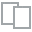
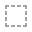
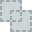
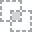
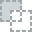
...
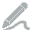
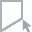
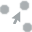
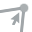
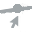

In [ ]:
# Διερευνητική ανάλυση δεδομένων (Exploratory Data Analysis - EDA)
create_report(dataset)

In [ ]:
# Ορισμός X και y και Αφαίρεση κατηγορικών μεταβλητών
X = dataset.drop(['Label-2', 'Src_IP', 'Dst_IP'], axis=1)
y = dataset['Label-1']

In [ ]:
# Υπολογισμός pps score
predictors_df = pps.predictors(X, "Label-1")

<Axes: xlabel='x', ylabel='ppscore'>

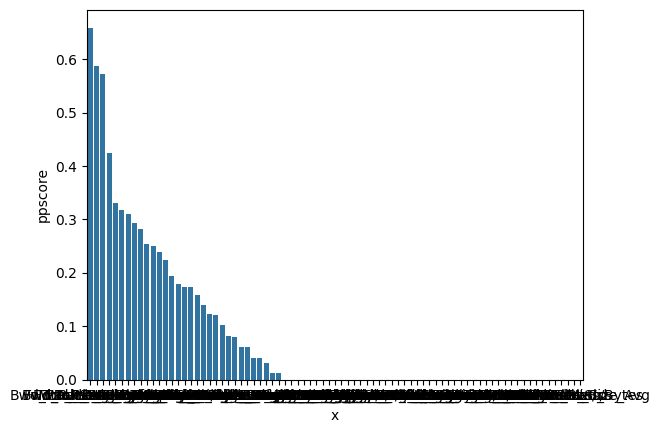

In [ ]:
sns.barplot(data=predictors_df, x="x", y="ppscore")

In [ ]:
# Εξαγωγή χαρακτηριστικών (ανεξάρτητων μεταβλητών)
# Αφαίρεση μεταβλητών που δεν προσφέρουν στη διαδικασία πρόβλεψης
variable_names = predictors_df['x'].to_list()
pps_scores = predictors_df['ppscore'].to_list()
excluded = []
threshold = 0.10
for variable, pps_score in zip(variable_names, pps_scores):
  if pps_score <= threshold:
    excluded.append(variable)
print(f"Removing {len(excluded)} features: {excluded}")

X = X.drop(excluded, axis=1)

Removing 57 features: ['Bwd_Bulk_Rate_Avg', 'Flow_IAT_Min', 'Bwd_Packet_Length_Std', 'Fwd_Packet_Length_Std', 'Bwd_Packet_Length_Mean', 'Bwd_Segment_Size_Avg', 'Subflow_Fwd_Bytes', 'Packet_Length_Std', 'Packet_Length_Variance', 'Protocol', 'Fwd_Packet_Length_Min', 'Fwd_PSH_Flags', 'Bwd_PSH_Flags', 'Fwd_URG_Flags', 'Bwd_URG_Flags', 'Packet_Length_Min', 'FIN_Flag_Count', 'SYN_Flag_Count', 'RST_Flag_Count', 'URG_Flag_Count', 'CWE_Flag_Count', 'ECE_Flag_Count', 'Down/Up_Ratio', 'Fwd_Bytes/Bulk_Avg', 'Fwd_Packet/Bulk_Avg', 'Fwd_Bulk_Rate_Avg', 'Bwd_Bytes/Bulk_Avg', 'Subflow_Fwd_Packets', 'Subflow_Bwd_Packets', 'Fwd_Seg_Size_Min', 'Active_Mean', 'Active_Std', 'Active_Max', 'Active_Min', 'Flow_Duration', 'Fwd_Packet_Length_Mean', 'Bwd_Packet_Length_Min', 'Flow_Bytes/s', 'Flow_Packets/s', 'Flow_IAT_Mean', 'Flow_IAT_Std', 'Flow_IAT_Max', 'Fwd_IAT_Total', 'Fwd_IAT_Mean', 'Fwd_IAT_Std', 'Fwd_IAT_Max', 'Fwd_IAT_Min', 'Bwd_IAT_Total', 'Bwd_IAT_Mean', 'Bwd_IAT_Std', 'Bwd_IAT_Max', 'Bwd_IAT_Min', 'Fw

In [ ]:
y.replace({'Non-Tor': 0, 'Tor': 1}, inplace=True)

In [ ]:
# Αφαίρεση της μεταβλητής στόχου από τις ανεξάρτητες μεταβλητές
X = X.drop(['Label-1'], axis=1)

In [ ]:
# Τμηματοποίηση συνόλου σε δεδομένα εκπαίδευσης και δοκιμών
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Τεχνική υπερδειγματοληψίας SMOTE
smote = SMOTE()
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

In [ ]:
# Κλιμάκωση δεδομένων
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
# Αλγόριθμοι-ταξινομητές
classifiers = [
    LogisticRegression(),
    SVC(),
    RandomForestClassifier(),
    MLPClassifier(),
    KNeighborsClassifier(),
    DecisionTreeClassifier()
]

In [ ]:
# Εκτίμηση και σύγκριση ταξινομητών
results = {'Classifier': [], 'Accuracy': [], 'Precision': [], 'Recall': [], 'F1 Score': []}

for clf in classifiers:
  clf_name = clf.__class__.__name__

  # Εκπαίδευση ταξινομητή
  clf.fit(X_train, y_train)

  # Πρόβλεψη και αποκλεισμός κυκλοφορίας εάν η προβλεπόμενη τιμή είναι 1 (Tor)
  y_pred = clf.predict(X_test)

  blocked_indices = len([pred for pred in y_pred if pred == 1])
  print(f"{clf_name}: Blocking {blocked_indices} malicious traffic instances.")

  # Υπολογισμός μετρικών αξιολόγησης
  acc = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred, average='weighted')
  recall = recall_score(y_test, y_pred, average='weighted')
  f1 = f1_score(y_test, y_pred, average='weighted')

  # Πίνακας σύγχυσης
  cm = confusion_matrix(y_test, y_pred)

  # Παρουσίαση αποτελεσμάτων
  print(f"\n{clf_name} Metrics:")
  print(f"Accuracy: {acc}")
  print(f"Precision: {precision}")
  print(f"Recall: {recall}")
  print(f"F1 Score: {f1}")
  print("Confusion Matrix:")
  print(cm)

  # Αποθήκευση αποτελεσμάτων για τη σύγκριση
  results['Classifier'].append(clf_name)
  results['Accuracy'].append(acc)
  results['Precision'].append(precision)
  results['Recall'].append(recall)
  results['F1 Score'].append(f1)

LogisticRegression: Blocking 228 malicious traffic instances.

LogisticRegression Metrics:
Accuracy: 0.9903032954214056
Precision: 0.9896600183826993
Recall: 0.9903032954214056
F1 Score: 0.9898247748534821
Confusion Matrix:
[[13396    41]
 [   92   187]]
SVC: Blocking 234 malicious traffic instances.

SVC Metrics:
Accuracy: 0.9936570428696413
Precision: 0.9933786695965665
Recall: 0.9936570428696413
F1 Score: 0.9933841446982196
Confusion Matrix:
[[13416    21]
 [   66   213]]
RandomForestClassifier: Blocking 254 malicious traffic instances.

RandomForestClassifier Metrics:
Accuracy: 0.9971566054243219
Precision: 0.997110706485564
Recall: 0.9971566054243219
F1 Score: 0.9970912430157458
Confusion Matrix:
[[13430     7]
 [   32   247]]
MLPClassifier: Blocking 222 malicious traffic instances.

MLPClassifier Metrics:
Accuracy: 0.9946777486147564
Precision: 0.9945480105293041
Recall: 0.9946777486147564
F1 Score: 0.9943806181371434
Confusion Matrix:
[[13429     8]
 [   65   214]]
KNeighborsCla

In [ ]:
# Παρουσίαση αποτελεσμάτων σύγκρισης
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by='Accuracy', ascending=False)
print("\nComparison of Classifiers:")
print(results_df)


Comparison of Classifiers:
               Classifier  Accuracy  Precision    Recall  F1 Score
2  RandomForestClassifier  0.997157   0.997111  0.997157  0.997091
5  DecisionTreeClassifier  0.997084   0.997044  0.997084  0.997058
4    KNeighborsClassifier  0.995698   0.995580  0.995698  0.995566
3           MLPClassifier  0.994678   0.994548  0.994678  0.994381
1                     SVC  0.993657   0.993379  0.993657  0.993384
0      LogisticRegression  0.990303   0.989660  0.990303  0.989825
